
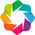

In [1]:
from candlesimport import CandlesImport

import pandas as pd
import matplotlib
import datetime
import holoviews as hv
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from holoviews.operation.timeseries import rolling, rolling_outlier_std
from holoviews.streams import Stream
hv.notebook_extension('bokeh')

In [2]:
def to_dataFrame(filename):
    cInport = CandlesImport()
    candles = cInport.importFromPickle(filename)
    return pd.DataFrame.from_dict(candles).set_index(['date'])

In [3]:
candles_btc, candles_ltc = map(to_dataFrame,('btc360.p','ltc360.p'))

In [4]:
candles_btc.tail()

,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
1517016300,10940.192199,10940.192199,10909.301221,10915.178133,7.908582,86400.845385,10924.947907
1517016600,10985.561390,11000.000000,10925.218823,10940.192199,7.954362,87136.600451,10954.568611
1517016900,11016.895683,11016.895683,10966.057770,10985.561390,7.168100,78829.286364,10997.236473
1517017200,10998.072717,11030.052477,10988.505416,11016.895683,1.696027,18663.869323,11004.464482
1517017500,10985.072717,10990.523360,10953.460154,10990.523360,5.097566,55965.885753,10978.942520


In [5]:
candles_ltc.tail()

,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
1517016300,174.000000,174.522096,174.000000,174.000001,22.175336,3858.517629,174.000410
1517016600,174.522096,174.522096,173.599999,174.000000,147.353450,25582.368039,173.612278
1517016900,175.215686,175.215686,174.028567,174.726000,4.222041,736.724025,174.494742
1517017200,175.000000,175.449184,174.522097,175.215686,18.370926,3217.186198,175.123786
1517017500,175.449182,175.449182,175.449182,175.449182,0.017376,3.048593,175.449182


In [6]:
def load_symbol(symbol, **kwargs):
    df = data[symbol]
    df['date'] = df.index
    return hv.Curve(df, ('date', 'Date'), ('close', 'Close price'))

stock_symbols = ['LTC', 'BTC',]
data = {"LTC": candles_ltc, 'BTC':candles_btc}
dmap = hv.DynamicMap(load_symbol, kdims='Symbol').redim.values(Symbol=stock_symbols)

In [7]:
%%opts Curve [width=700] {+framewise}
dmap

:DynamicMap   [Symbol]
   :Curve   [date]   (close)

In [8]:
%%opts Scatter [width=700] (color='black')
smoothed = dmap*rolling(dmap, rolling_window=30)*rolling_outlier_std(dmap)
smoothed

:DynamicMap   [Symbol]
   :Overlay
      .Curve.I   :Curve   [date]   (close)
      .Curve.II  :Curve   [date]   (close)
      .Scatter.I :Scatter   [date]   (close)

In [9]:
%%opts Curve [width=700, height=500, show_grid=True] {+framewise}
def rolling_corr(w):
    S = candles_ltc['close'].rolling(w).corr(other=candles_btc['close'])
    candles_ltc['corrBTC'] = S
    return hv.Curve(candles_ltc.iloc[-1000:], ('date', 'Date'), ('corrBTC','Rolling correlation'))
    
winsize = {s:rolling_corr(s) for s in range(10,60,2)}
rcorr = hv.HoloMap(winsize, kdims='Window size')
rcorr

:HoloMap   [Window size]
   :Curve   [date]   (corrBTC)

In [10]:
%%opts Curve [width=700, height=500, show_grid=True] {+framewise}
def rolling_vol(w, symbol):
    dt = data[symbol]
    S = dt['close'].rolling(w).std()
    dt['Volatility'] = S
    dt['date'] = candles_ltc.index

    return hv.Curve(dt.iloc[-2000:], ('date', 'Date'), ('Volatility','Rolling volatility'))

stock_symbols = ['LTC', 'BTC',]
data = {"LTC": candles_ltc, 'BTC': candles_btc}    
winsize = range(10,60,2)
rvol = hv.DynamicMap(rolling_vol, kdims=['Wsize', 'Symbol']).redim.values(Symbol=stock_symbols).redim.range(Wsize=(10,60))
rvol

:DynamicMap   [Wsize,Symbol]
   :Curve   [date]   (Volatility)

In [11]:
candles_ltc['5m_return'] = candles_ltc.close/candles_ltc.close.shift(1) - 1
candles_btc['5m_return'] = candles_btc.close/candles_btc.close.shift(1) - 1

In [12]:
%%opts Curve [width=700, height=500, show_grid=True] {+framewise}
hv.Curve(candles_ltc[-10000:], ('date', 'Date'),('5m_return', '5m Return rate'), label='Litecoin returns').hist(num_bins=150)

:AdjointLayout
   :Curve   [date]   (5m_return)
   :Histogram   _return]   (5m_return_frequency)